In [11]:
#pip install pandas
#pip install numpy
#pip install matplotlib
#pip install seaborn
#pip install scikit-learn
#pip install statsmodels
#pip install scipy

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter, MultipleLocator
import matplotlib.dates as mdates
from matplotlib.widgets import SpanSelector

In [4]:
df = pd.read_excel('https://raw.githubusercontent.com/Amber-tech23/Patterns-of-Political-Leadership-Succession-and-National-Development/main/archigos%208.0_1.xlsx')

In [5]:
df = df[df['exitcode'] != 'Still in Office']
df = df[(df['idacr'] != 'TAW') & (df['idacr'] != 'TBT')]

df = df.dropna(subset=['startdate_new'])
df = df.dropna(subset=['enddate_new'])

In [6]:
df['colonial_duration'] = df.apply(
    lambda row: row['colonial_end'] - row['colonial_begin'] 
    if pd.notna(row['colonial_end']) and pd.notna(row['colonial_begin']) 
    else pd.NA, axis=1
)

In [7]:
df['start_year'] = pd.to_datetime(df['startdate_new']).dt.year
df.insert(df.columns.get_loc('startdate_new'), 'start_year', df.pop('start_year'))

df['end_year'] = pd.to_datetime(df['enddate_new']).dt.year
df.insert(df.columns.get_loc('enddate_new'), 'end_year', df.pop('end_year'))

In [8]:
pd.set_option('display.max_columns', None)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3228 entries, 0 to 3406
Data columns (total 47 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  3228 non-null   int64  
 1   obsid                       3228 non-null   object 
 2   leadid                      3228 non-null   object 
 3   ccode                       3228 non-null   int64  
 4   idacr                       3228 non-null   object 
 5   country                     3228 non-null   object 
 6   continent                   3228 non-null   object 
 7   leader                      3228 non-null   object 
 8   startdate                   3228 non-null   object 
 9   start_year                  3228 non-null   int32  
 10  startdate_new               3228 non-null   object 
 11  enddate                     3228 non-null   object 
 12  end_year                    3228 non-null   int32  
 13  enddate_new                 3228 non-n

## 1. Plot the distribution of tenure ##

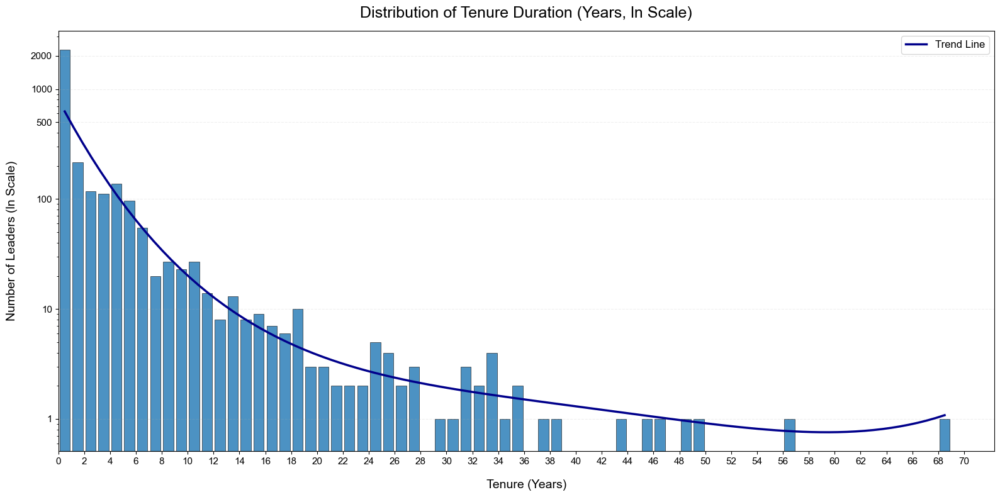

In [10]:
# Configuration
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.unicode_minus'] = False
plt.figure(figsize=(16, 8))

df['tenure_years'] = pd.to_numeric(df['tenure_years'], errors='coerce')
df_clean = df.dropna(subset=['tenure_years'])

# 1-year class interval calculation
min_tenure = np.floor(df_clean['tenure_years'].min())
max_tenure = np.ceil(df_clean['tenure_years'].max())
bins = np.arange(min_tenure, max_tenure + 1, 1)
counts, bin_edges = np.histogram(df_clean['tenure_years'], bins=bins)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw a bar chart (natural logarithm on the vertical axis).
plt.semilogy(  
    bin_centers,
    counts,
    color='#1f77b4',
    marker='',  
    linestyle=''
)
bars = plt.bar(
    bin_centers,
    counts,
    width=0.8,
    edgecolor='black',
    linewidth=0.5,
    color='#1f77b4',
    alpha=0.8
)

# Filter out non-zero data (to avoid logarithmic errors)
valid_mask = counts > 0
valid_x = bin_centers[valid_mask]
valid_y = counts[valid_mask]

# Polynomial fitting 
degree = 4
z = np.polyfit(valid_x, np.log(valid_y), degree)  # 对y取ln后拟合
poly_func = np.poly1d(z)
smooth_x = np.linspace(valid_x.min(), valid_x.max(), 100)
smooth_y = np.exp(poly_func(smooth_x))  

# Draw smooth trend lines
plt.plot(
    smooth_x,
    smooth_y,
    color='darkblue',
    linewidth=2.5,
    linestyle='-',
    label='Trend Line'
)

# y axis
# --------------------------
plt.ylabel('Number of Leaders (ln Scale)', fontsize=14, labelpad=15)
plt.yticks([1, 10, 100, 500, 1000, 2000], ['1', '10', '100', '500', '1000', '2000'], fontsize=11)

# The horizontal axis maintains a 2-year scale.
plt.xlabel('Tenure (Years)', fontsize=14, labelpad=15)
max_tick = np.ceil(max_tenure) if np.ceil(max_tenure) % 2 == 0 else np.ceil(max_tenure) + 1
x_ticks = np.arange(0, max_tick + 2, 2)
plt.xticks(x_ticks, fontsize=11)
plt.xlim(left=0)

plt.title('Distribution of Tenure Duration (Years, ln Scale)', fontsize=18, pad=15)
plt.grid(axis='y', alpha=0.2, linestyle='--')
plt.legend(loc='upper right', fontsize=12)
plt.tight_layout()
plt.show()

## 2. Plot numbers of countries in each continent ##

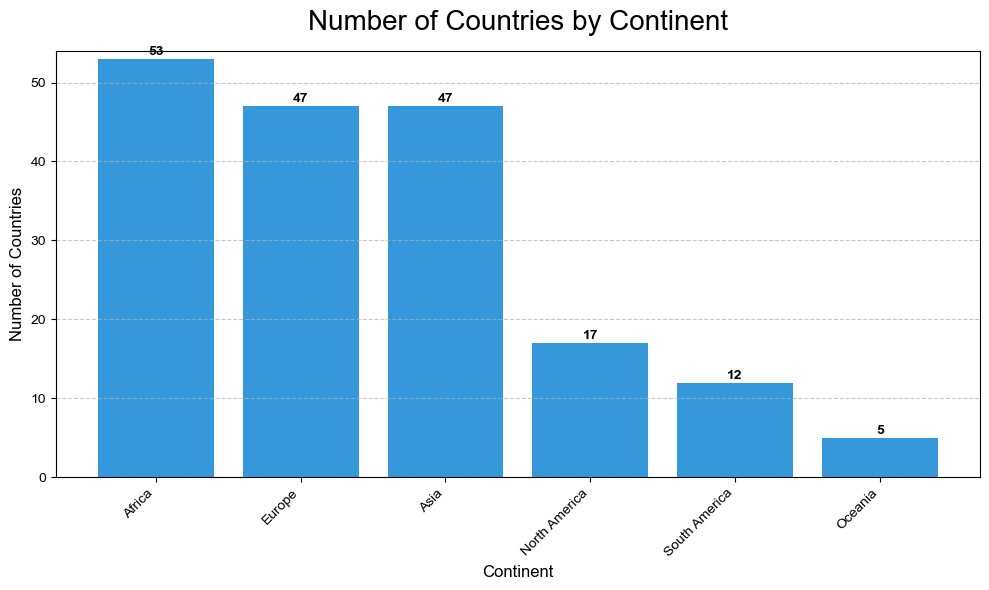

Number of countries in each continent (after deduplication)：
       continent  country_count
0         Africa             53
1         Europe             47
2           Asia             47
3  North America             17
4  South America             12
5        Oceania              5


In [9]:
unique_countries = df.drop_duplicates(subset=['country'])  
continent_counts = unique_countries['continent'].value_counts().reset_index()
continent_counts.columns = ['continent', 'country_count']

# Ranking
continent_counts = continent_counts.sort_values('country_count', ascending=False)

# Draw a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(
    continent_counts['continent'],
    continent_counts['country_count'],
    color='#3498DB'  
)

# The number of countries is marked on each column.
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2.,  
        height + 0.1,  
        f'{int(height)}',  
        ha='center',  
        va='bottom',  
        fontsize=10,
        fontweight='bold'
    )

plt.xlabel('Continent', fontsize=12)
plt.ylabel('Number of Countries', fontsize=12)
plt.title('Number of Countries by Continent', fontsize=20, pad=15)
plt.xticks(rotation=45, ha='right')  # 旋转大洲名称避免重叠
plt.ylim(0, max(continent_counts['country_count']) + 1)  # y轴留一点余量
plt.grid(axis='y', linestyle='--', alpha=0.7)  # 仅显示横向网格线
plt.tight_layout()
plt.show()

print("Number of countries in each continent (after deduplication)：")
print(continent_counts)

## 3. Top 20 longest service leader ##

### 3.1. start year, end year and duration ###

In [26]:
def get_top10_tenure(df):    
    # Sort by tenure_years in descending order and select the top ten.
    top10_tenure_df = df.sort_values(
        by='tenure_years', 
        ascending=False
    )
    
    # Extract specified fields and reset indexes
    top10_tenure_df = top10_tenure_df[[
        'idacr', 'country', 'continent', 'leader', 
        'startdate', 'start_year', 'startdate_new', 
        'enddate', 'end_year', 'enddate_new', 
        'entry', 'exit', 'tenure_years'
    ]].reset_index(drop=True)
    
    return top10_tenure_df

top10_data = get_top10_tenure(df)

In [27]:
top10_data.head()top10_data

,idacr,country,continent,leader,startdate,start_year,startdate_new,enddate,end_year,enddate_new,entry,exit,tenure_years
0,AUH,Austria-Hungary,Europe,Francis Joseph I,1848-12-02,1848,1848/12/02,1916-11-21 00:00:00,1916,1916-11-21 00:00:00,Regular,Natural Death,68.014
1,MNG,Montenegro,Europe,Nikola I Petrovic-Njegos,1860-08-13,1860,1860/08/13,1917-01-17 00:00:00,1917,1917-01-17 00:00:00,Regular,Foreign,56.466
2,BRA,Brazil,South America,Pedro II,1840-07-23,1840,1840/07/23,1889-11-15,1889,1889/11/15,Regular,Irregular,49.348
3,RUM,Romania,Europe,Carol I,1866-05-22,1866,1866/05/22,1914-10-10 00:00:00,1914,1914-10-10 00:00:00,Regular,Natural Death,48.416
4,JOR,Jordan,Asia,Hussein Ibn Talal El-Hashim,1952-08-11 00:00:00,1952,1952-08-11 00:00:00,1999-02-07 00:00:00,1999,1999-02-07 00:00:00,Regular,Natural Death,46.523


C:\Users\DH\AppData\Local\Temp\ipykernel_19268\2899919122.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data['leader_country'] = plot_data['leader'] + ' - ' + plot_data['country']


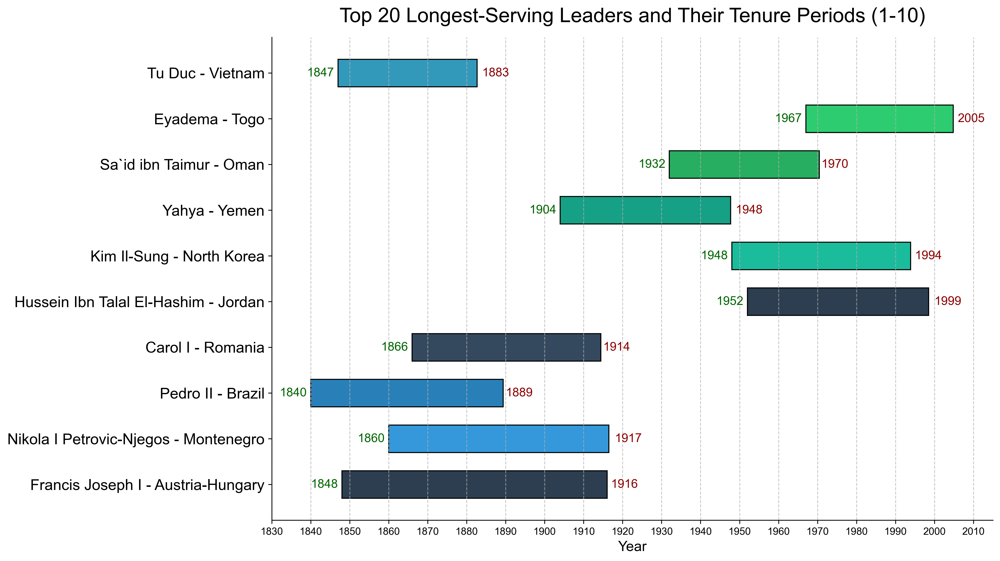

In [24]:
def plot_leader_tenure_timeline(top10_data):
    # Select the top 10 and sort by tenure length in descending order (longest on top)
    top10_data = top10_data.sort_values('tenure_years', ascending=False).head(10).reset_index(drop=True)
    
    # Extract fields and generate labels
    plot_data = top10_data[['leader', 'country', 'start_year', 'end_year', 'tenure_years']]
    plot_data['leader_country'] = plot_data['leader'] + ' - ' + plot_data['country']
    
    # Custom soft color palette
    custom_colors = [
        '#2D3E50', '#3498DB', '#2980B9', '#34495E', '#2C3E50', 
        '#1ABC9C', '#16A085', '#27AE60', '#2ECC71', '#3299BB'
    ]
    
    # Plot settings
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(14, 8))
    
    # Get the current axes object for later hiding borders
    ax = plt.gca()
    
    # Draw the bar chart
    for i, row in plot_data.iterrows():
        ax.barh(
            y=i,
            width=row['tenure_years'],
            left=row['start_year'],
            height=0.6,
            color=custom_colors[i % len(custom_colors)],
            edgecolor='black'
        )
        
        # Annotate start year (shift a little to the left)
        ax.text(
            x=row['start_year'] - 1,  # Core: subtract 1 from the original year (shift left)
            y=i,
            s=int(row['start_year']),
            va='center',
            ha='right',  # Keep right-aligned (text aligns to the right side of x position)
            fontsize=12,
            color='darkgreen'
        )
        
        # Annotate end year (shift a little to the right)
        ax.text(
            x=row['end_year'] + 1,  # Core: add 1 to the original year (shift right)
            y=i,
            s=int(row['end_year']),
            va='center',
            ha='left',  # Keep left-aligned (text aligns to the left side of x position)
            fontsize=12,
            color='darkred'
        )
    
    # Set X-axis: start at 1830, interval of 10
    max_year = max(plot_data['end_year'].max(), 1830)
    x_ticks = range(1830, int(max_year) + 10, 10)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([str(tick) for tick in x_ticks], fontsize=10)
    ax.set_xlim(1830, int(max_year) + 10)
    
    # Y-axis settings
    ax.set_yticks(range(len(plot_data)))
    ax.set_yticklabels(plot_data['leader_country'], fontsize=15)
    
    # Hide top and right borders (grid frame)
    ax.spines['top'].set_visible(False)    # Remove top border
    ax.spines['right'].set_visible(False)  # Remove right border
    
    # Keep only X-axis grid lines (horizontal grid), hide Y-axis grid lines
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    ax.grid(axis='y', visible=False)       # Hide Y-axis grid lines
    
    # Labels and title (in English)
    ax.set_xlabel('Year', fontsize=14)
    ax.set_title('Top 20 Longest-Serving Leaders and Their Tenure Periods (1-10)', fontsize=20, pad=15)
    
    plt.tight_layout()
    plt.show()

# Call the function
plot_leader_tenure_timeline(top10_data)

C:\Users\DH\AppData\Local\Temp\ipykernel_19268\552746967.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_data['leader_country'] = plot_data['leader'] + ' - ' + plot_data['country']


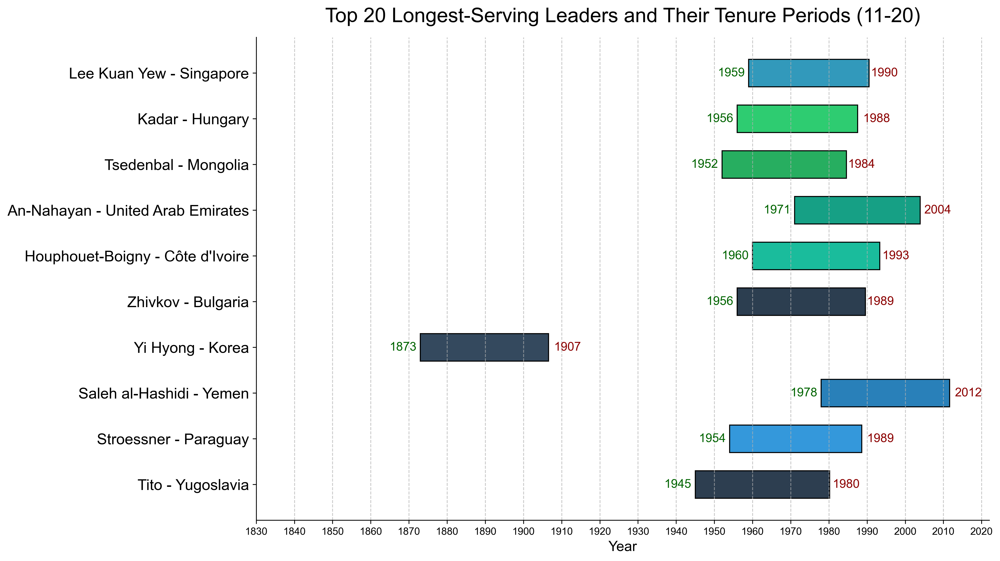

In [25]:
top20_data = top10_data.sort_values('tenure_years', ascending=False).head(20).reset_index(drop=True)

def plot_top11to20_leaders(top20_data):
    # Select ranks 11-20 (take rows 11-20 after sorting by tenure length in descending order)
    top11to20_data = top20_data.sort_values('tenure_years', ascending=False).iloc[10:20].reset_index(drop=True)
    
    # Extract fields and generate labels
    plot_data = top11to20_data[['leader', 'country', 'start_year', 'end_year', 'tenure_years']]
    plot_data['leader_country'] = plot_data['leader'] + ' - ' + plot_data['country']
    
    # Custom soft color palette (consistent with ranks 1-10)
    custom_colors = [
        '#2D3E50', '#3498DB', '#2980B9', '#34495E', '#2C3E50', 
        '#1ABC9C', '#16A085', '#27AE60', '#2ECC71', '#3299BB'
    ]
    
    # Plot settings
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(14, 8))
    ax = plt.gca()
    
    # Draw the bar chart
    for i, row in plot_data.iterrows():
        ax.barh(
            y=i,
            width=row['tenure_years'],
            left=row['start_year'],
            height=0.6,
            color=custom_colors[i % len(custom_colors)],
            edgecolor='black'
        )
        
        # Annotate start year (shift left)
        ax.text(
            x=row['start_year'] - 1,
            y=i,
            s=int(row['start_year']),
            va='center',
            ha='right',
            fontsize=12,
            color='darkgreen'
        )
        
        # Annotate end year (shift right)
        ax.text(
            x=row['end_year'] + 1,
            y=i,
            s=int(row['end_year']),
            va='center',
            ha='left',
            fontsize=12,
            color='darkred'
        )
    
    # Set X-axis (start at 1830, interval of 10)
    max_year = max(plot_data['end_year'].max(), 1830)
    x_ticks = range(1830, int(max_year) + 10, 10)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([str(tick) for tick in x_ticks], fontsize=10)
    ax.set_xlim(1830, int(max_year) + 10)
    
    # Y-axis settings
    ax.set_yticks(range(len(plot_data)))
    ax.set_yticklabels(plot_data['leader_country'], fontsize=15)
    
    # Hide top and right borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Grid line settings
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    ax.grid(axis='y', visible=False)
    
    # Labels and title (clarifying ranks 11-20)
    ax.set_xlabel('Year', fontsize=14)
    ax.set_title('Top 20 Longest-Serving Leaders and Their Tenure Periods (11-20)', fontsize=20, pad=15)
    
    plt.tight_layout()
    plt.show()

# Example usage:
# Assume top20_data contains the complete data for the top 20 leaders
plot_top11to20_leaders(top20_data)  # Only plot ranks 11-20

### 3-2. Entry and Exit mode ###

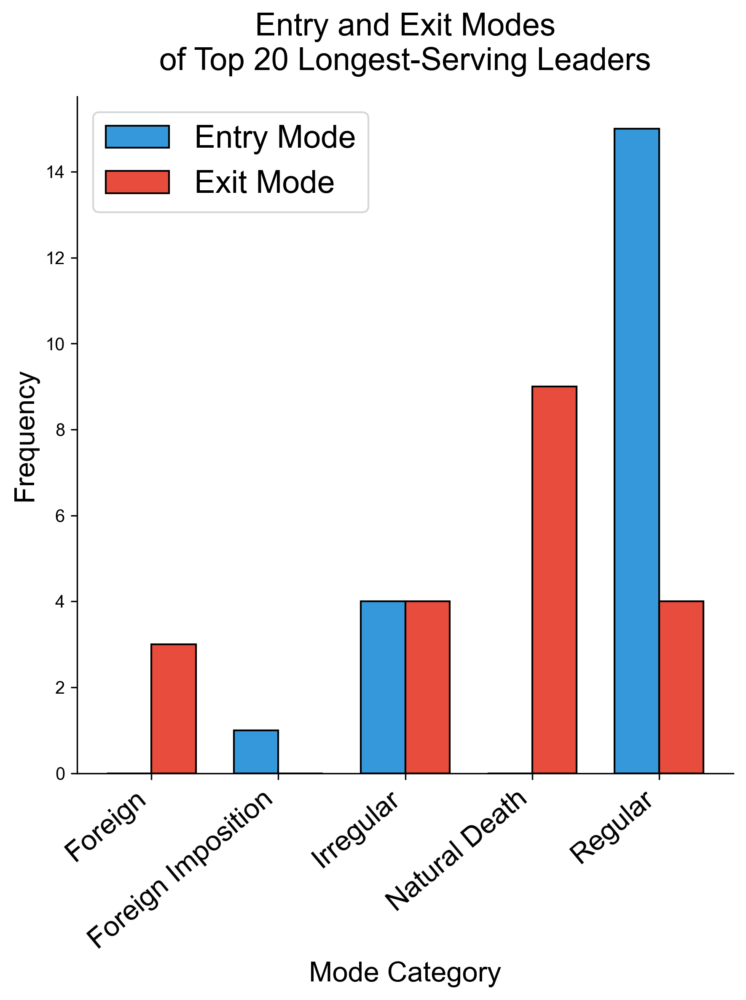

In [12]:
def plot_entry_exit_bar(top10_data):
    # 提取前20条数据
    data = top10_data.head(20)
    
    # 统计上台和下台方式的频次
    entry_counts = data['entry'].value_counts()
    exit_counts = data['exit'].value_counts()
    
    # 合并类别（确保两类别的类别一致）
    all_categories = sorted(list(set(entry_counts.index) | set(exit_counts.index)))
    entry_values = [entry_counts.get(cat, 0) for cat in all_categories]
    exit_values = [exit_counts.get(cat, 0) for cat in all_categories]
    
    # 定义与时间轴图一致的色系（柔和深色系）
    custom_colors = [
        '#3498DB',  # 上台方式：亮蓝色（与时间轴图中蓝色系呼应）
        '#E74C3C'   # 下台方式：深红色（与时间轴图中红色标注呼应）
    ]
    
    # 绘图设置
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(6, 8))
    bar_width = 0.35
    index = range(len(all_categories))
    
    # 绘制分组条形图（应用自定义色系）
    plt.bar(
        [i - bar_width/2 for i in index], 
        entry_values, 
        width=bar_width, 
        label='Entry Mode', 
        color=custom_colors[0],  # 上台方式用亮蓝色
        edgecolor='black'
    )
    plt.bar(
        [i + bar_width/2 for i in index], 
        exit_values, 
        width=bar_width, 
        label='Exit Mode', 
        color=custom_colors[1],  # 下台方式用深红色
        edgecolor='black'
    )
    
    # 设置标签和标题（英文，与前文统一）
    plt.xlabel('Mode Category', fontsize=16)
    plt.ylabel('Frequency', fontsize=16)
    plt.title('Entry and Exit Modes\nof Top 20 Longest-Serving Leaders', fontsize=18, pad=15)
    plt.xticks(index, all_categories, rotation=40, ha='right', fontsize=16)
    plt.legend(fontsize=18)
    
    # 隐藏顶部和右侧边框（与时间轴图风格一致）
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.show()

# 调用函数
plot_entry_exit_bar(top10_data)

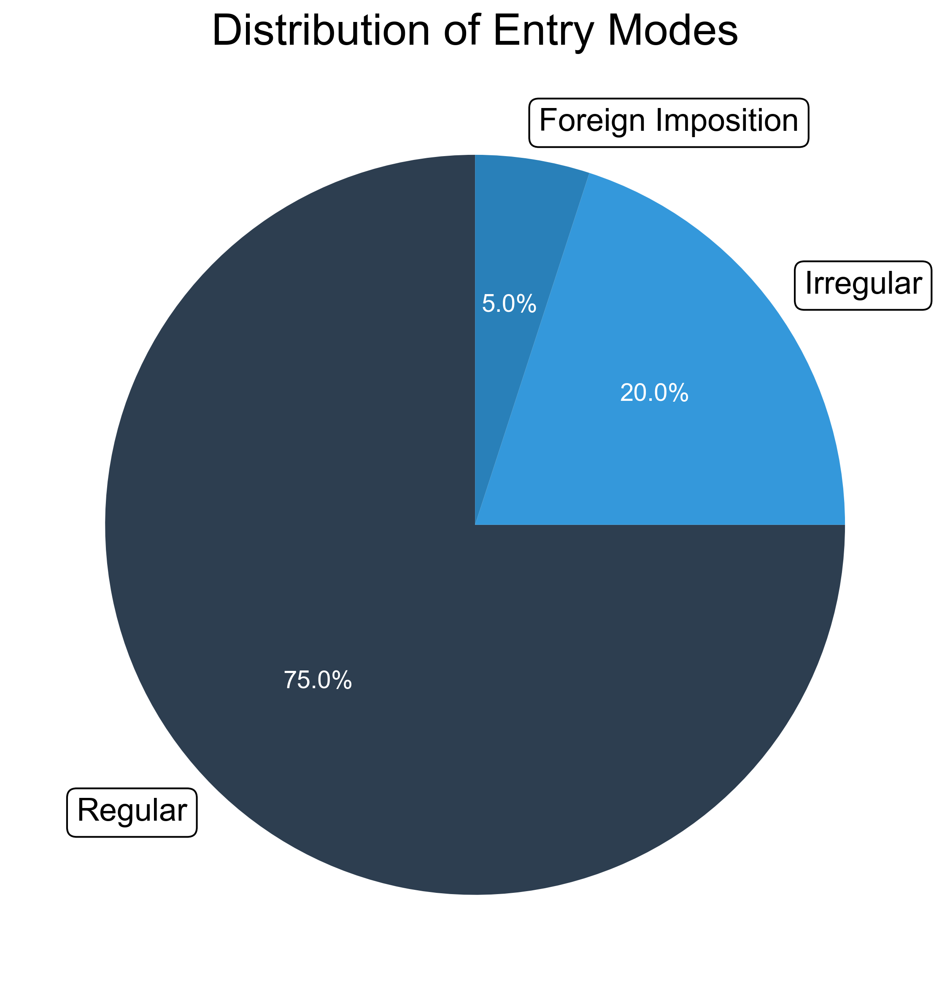

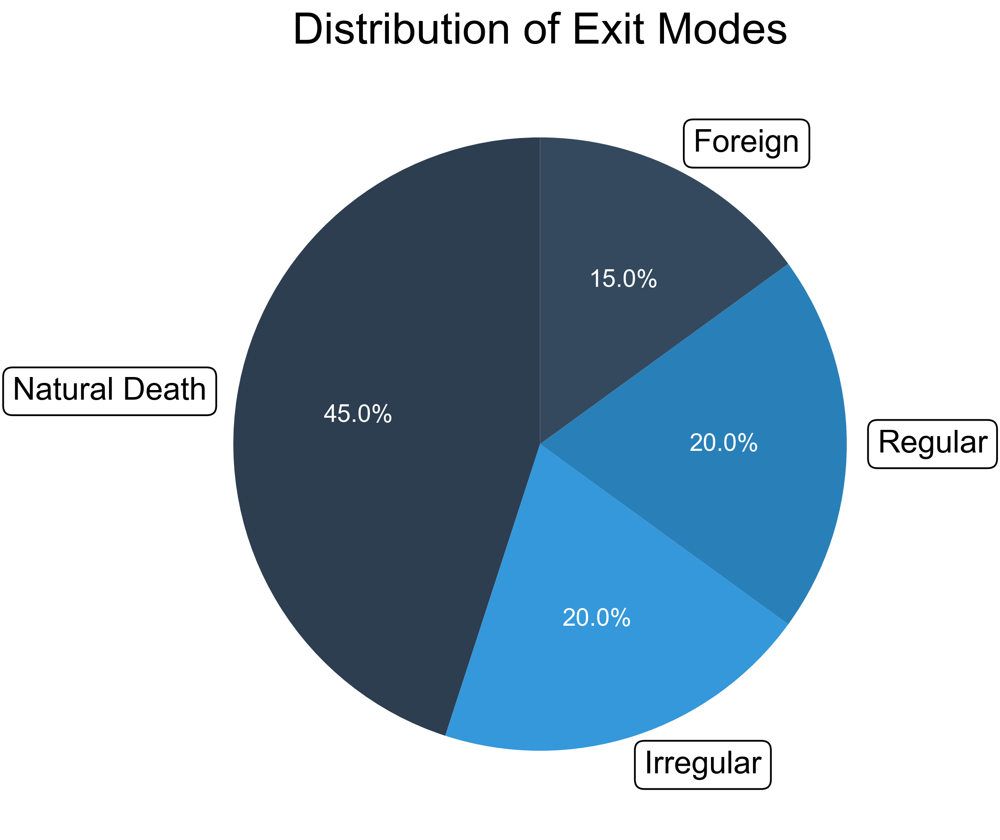

In [16]:
def plot_entry_piechart(top10_data):
    data = top10_data.head(20)
    entry_counts = data['entry'].dropna().value_counts()
    
    custom_colors = [
        '#2D3E50', '#3498DB', '#2980B9', '#34495E', '#2C3E50',
        '#1ABC9C', '#16A085', '#27AE60', '#2ECC71', '#3299BB']
    
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(8, 8))
    
    # Draw a pie chart and get the text object
    wedges, texts, autotexts = plt.pie(
        entry_counts.values,
        labels=entry_counts.index,
        colors=custom_colors[:len(entry_counts)],
        autopct='%1.1f%%',  # percentage format
        startangle=90,
        textprops={'fontsize': 18
                  }  # Basic font size for label text
    )
    
    # Adjust the data labels: white background + black border
    for text in texts:
        text.set_bbox(dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    
    # Adjust percentage text: Increase font size + white text (for contrast against dark background)
    for autotext in autotexts:
        autotext.set_fontsize(14)  # Enlarge percentage font size
        autotext.set_color('white')  # white background
        autotext.set_bbox(dict(facecolor='none', edgecolor='none'))  # no facecolor and edge color
    
    plt.title('Distribution of Entry Modes', fontsize=25, pad=10)
    plt.tight_layout()
    plt.show()

def plot_exit_piechart(top10_data):
    data = top10_data.head(20)
    exit_counts = data['exit'].dropna().value_counts()
    
    custom_colors = [
        '#2D3E50', '#3498DB', '#2980B9', '#34495E', '#2C3E50',
        '#1ABC9C', '#16A085', '#27AE60', '#2ECC71', '#3299BB'
    ]
    
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(8, 8))
    
    # Draw a pie chart and get the text object
    wedges, texts, autotexts = plt.pie(
        exit_counts.values,
        labels=exit_counts.index,
        colors=custom_colors[:len(exit_counts)],
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 18}
    )
    
    # Adjust the data labels: white background + black border
    for text in texts:
        text.set_bbox(dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    
    # Adjust percentage text: Increase font size + white font
    for autotext in autotexts:
        autotext.set_fontsize(14)
        autotext.set_color('white')
        autotext.set_bbox(dict(facecolor='none', edgecolor='none'))
    
    plt.title('Distribution of Exit Modes', fontsize=25, pad=10)
    plt.tight_layout()
    plt.show()

# Calling functions
plot_entry_piechart(top10_data)
plot_exit_piechart(top10_data)

## 4. Leadership Transitions ##

### 4-1. Plot leadership transition figure of North America  ##

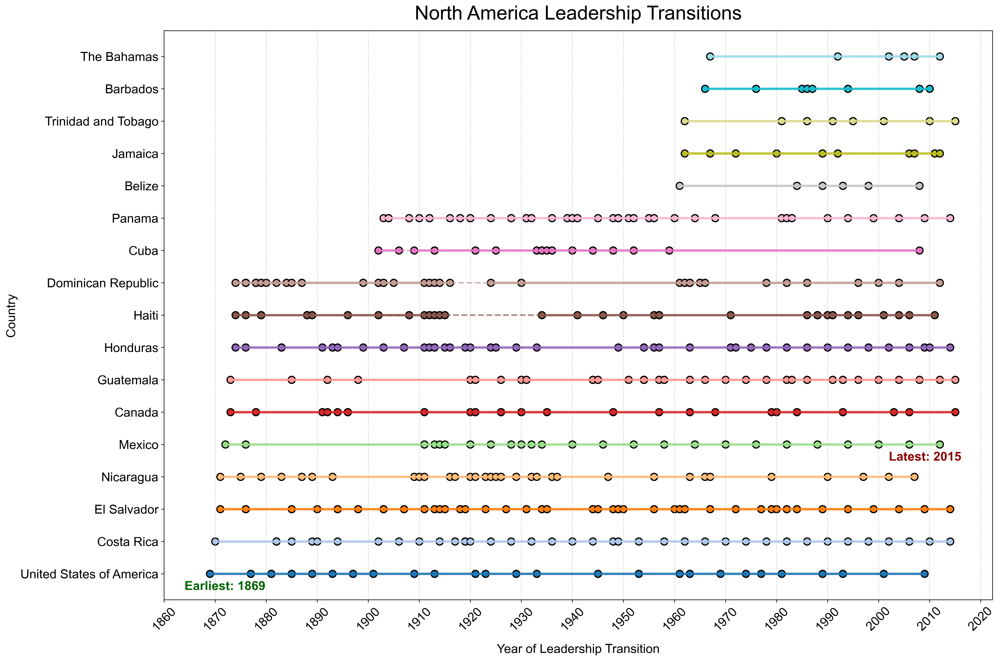

In [18]:
# Set font size uniformly
plt.rcParams['font.size'] = 16
plt.rcParams['figure.dpi'] = 300

# 1. Filtering North American data
na_df = df[df['continent'] == 'North America'].copy()

# 2. Sort by earliest start_year in ascending order (smallest at the bottom).
country_earliest = na_df.groupby('idacr')['start_year'].min().reset_index()
country_order = country_earliest.sort_values('start_year')['idacr'].tolist()

# 3. Generate a map of full country names
idacr_to_country = na_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
country_names = [idacr_to_country[idacr] for idacr in country_order]

# 4. Generate unique colors for each country.
n_countries = len(country_order)
colors = plt.cm.tab20(np.linspace(0, 1, n_countries))

# 5. Find the earliest start_year and the latest end_year of the whole.
min_start = na_df['start_year'].min()
max_end = na_df['end_year'].max()

# 6. plot setting
plt.figure(figsize=(18, 12))

# 7. Processing data for each country: Plotting line segments for periods in power and dashed lines for periods of inactivity.
for i, (idacr, color) in enumerate(zip(country_order, colors)):
    # Retrieve data on all terms of office for the current country and sort by the year of commencement.
    country_data = na_df[na_df['idacr'] == idacr].sort_values('start_year')
    
    # Extract the start and end years of the term of office.
    start_years = country_data['start_year'].dropna().values
    end_years = country_data['end_year'].dropna().values
    
    # Draw the line segment representing the period of governance (solid line).
    for s, e in zip(start_years, end_years):
        plt.plot([s, e], [i, i], color=color, linewidth=3, alpha=0.9)
        # Plot points at the beginning and end of the year.
        plt.scatter(s, i, color=color, s=80, edgecolors='black', linewidth=1.5)
        plt.scatter(e, i, color=color, s=80, edgecolors='black', linewidth=1.5)
    
    # The period of power vacuum (the time between the end of one term of office and the beginning of the next).
    if len(end_years) > 1:  # 至少有两个执政期才可能有空档
        for j in range(1, len(end_years)):
            prev_end = end_years[j-1]
            curr_start = start_years[j]
            # If the gap period is not zero (not consecutive), draw a dashed line.
            if not np.isclose(prev_end, curr_start):
                plt.plot([prev_end, curr_start], [i, i], 
                         color=color, linewidth=2, alpha=0.7, linestyle='--')

# 8. Mark the earliest and latest tags
earliest_idacr = na_df[na_df['start_year'] == min_start]['idacr'].iloc[0]
earliest_y = country_order.index(earliest_idacr)
plt.text(min_start - 5, earliest_y - 0.4, f"Earliest: {int(min_start)}", 
         verticalalignment='center', color='darkgreen', fontweight='bold')

latest_idacr = na_df[na_df['end_year'] == max_end]['idacr'].iloc[0]
latest_y = country_order.index(latest_idacr)
plt.text(max_end -13, latest_y - 1.4, f"Latest: {int(max_end)}", 
         verticalalignment='center', color='darkred', fontweight='bold')

# 9. Set the axes
plt.yticks(range(len(country_order)), country_names)
min_year = na_df['start_year'].min()
max_year = na_df['end_year'].max()  # 这里改为用end_year的最大值
start = int(min_year // 10 * 10)
end = int((max_year // 10 + 1) * 10)
xticks = range(start, end + 1, 10)
plt.xticks(xticks, rotation=45)

# 10. Other tags
plt.ylabel('Country')
plt.xlabel('Year of Leadership Transition', labelpad=14)
plt.title('North America Leadership Transitions', fontsize=25, pad=14)

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

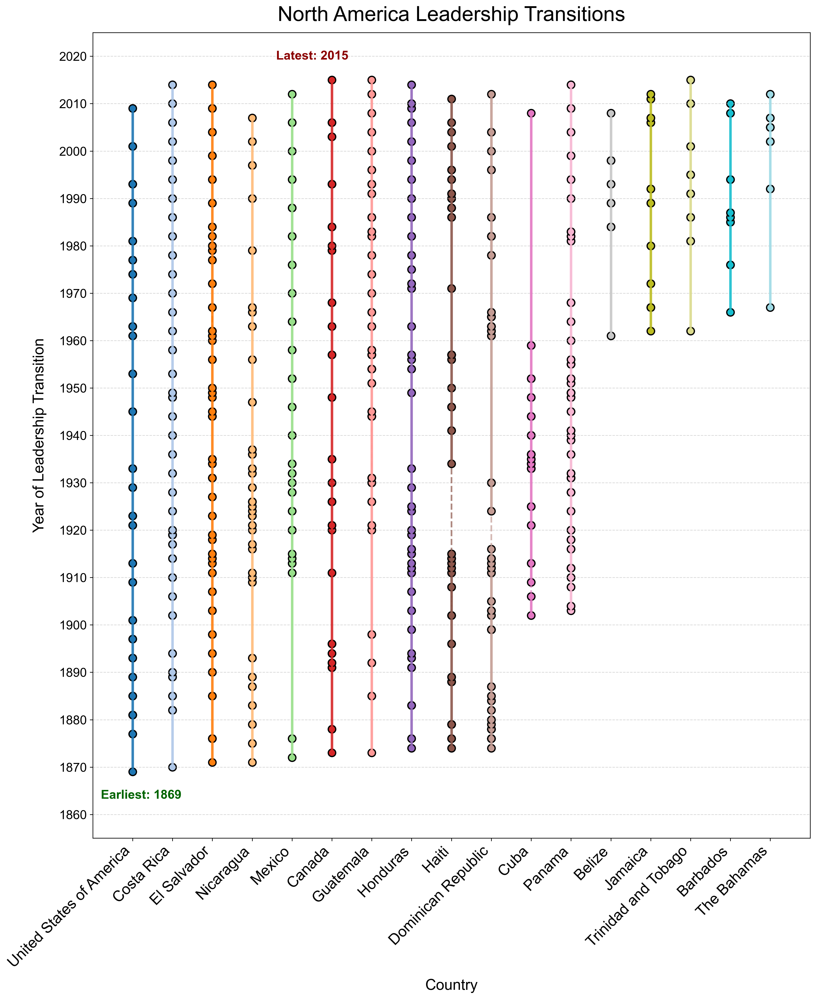

In [19]:
# 北美洲数据可视化（横纵轴互换，垂直线条，含空档期虚线）
def plot_north_america_leadership_transitions(df):
    # 1. 筛选北美洲数据
    na_df = df[df['continent'] == 'North America'].copy()
    
    # 2. 按最早start_year升序排序
    na_country_earliest = na_df.groupby('idacr')['start_year'].min().reset_index()
    na_country_order = na_country_earliest.sort_values('start_year')['idacr'].tolist()
    
    # 3. 生成国家全称映射
    na_idacr_to_country = na_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
    na_country_names = [na_idacr_to_country[idacr] for idacr in na_country_order]
    
    # 4. 生成专属颜色
    na_n_countries = len(na_country_order)
    na_colors = plt.cm.tab20(np.linspace(0, 1, na_n_countries))
    
    # 5. 计算极值（处理空值）
    na_valid_starts = na_df['start_year'].dropna()
    na_valid_ends = na_df['end_year'].dropna()
    
    na_min_start = na_valid_starts.min() if not na_valid_starts.empty else None
    na_max_end = na_valid_ends.max() if not na_valid_ends.empty else None
    
    # 6. 绘图设置
    plt.rcParams['font.size'] = 18
    plt.rcParams['figure.dpi'] = 300
    plt.figure(figsize=(14, 17))  # 宽高适配横纵轴互换
    
    # 7. 绘制执政期线段和空档期虚线（核心修改部分）
    for i, (idacr, color) in enumerate(zip(na_country_order, na_colors)):
        # 获取当前国家的所有执政周期并按时间排序
        country_data = na_df[na_df['idacr'] == idacr].sort_values('start_year')
        start_years = country_data['start_year'].dropna().values
        end_years = country_data['end_year'].dropna().values
        
        if len(start_years) > 0:  # 仅处理有数据的国家
            # 绘制每个执政期的实线（垂直线段）
            for s, e in zip(start_years, end_years):
                plt.plot([i, i], [s, e], color=color, linewidth=3, alpha=0.9)
                plt.scatter(i, s, color=color, s=80, edgecolors='black', linewidth=1.5)  # 开始点
                plt.scatter(i, e, color=color, s=80, edgecolors='black', linewidth=1.5)  # 结束点
            
            # 绘制空档期虚线（前一执政期结束到下一执政期开始）
            if len(end_years) > 1:  # 至少有两个执政期才可能有空档
                for j in range(1, len(end_years)):
                    prev_end = end_years[j-1]  # 上一个执政期结束年
                    curr_start = start_years[j]  # 当前执政期开始年
                    # 若不连续（空档期>0），绘制虚线
                    if not np.isclose(prev_end, curr_start):
                        plt.plot([i, i], [prev_end, curr_start], 
                                 color=color, linewidth=2, alpha=0.7, linestyle='--')
    
    # 8. 标记最早start_year
    if na_min_start is not None:
        na_earliest_mask = na_df['start_year'].between(na_min_start - 0.1, na_min_start + 0.1)
        na_earliest_subset = na_df[na_earliest_mask]
        
        if not na_earliest_subset.empty:
            na_earliest_idacr = na_earliest_subset['idacr'].iloc[0]
            na_earliest_x = na_country_order.index(na_earliest_idacr)
            plt.text(
                na_earliest_x - 0.8,
                na_min_start - 5,
                f"Earliest: {int(na_min_start)}",
                horizontalalignment='left', verticalalignment='center',
                color='darkgreen', fontweight='bold', fontsize=15
            )
    
    # 9. 标记最晚end_year
    if na_max_end is not None:
        na_latest_mask = na_df['end_year'].between(na_max_end - 0.1, na_max_end + 0.1)
        na_latest_subset = na_df[na_latest_mask]
        
        if not na_latest_subset.empty:
            na_latest_idacr = na_latest_subset['idacr'].iloc[0]
            na_latest_x = na_country_order.index(na_latest_idacr)
            plt.text(
                na_latest_x - 1.4,
                na_max_end +5,
                f"Latest: {int(na_max_end)}",
                horizontalalignment='left', verticalalignment='center',
                color='darkred', fontweight='bold', fontsize=15
            )
    
    # 10. 设置坐标轴
    plt.xticks(range(len(na_country_order)), na_country_names, rotation=45, ha='right')  # 横轴国家
    plt.xlim(-1, len(na_country_order))  # 横轴边距
    
    # 纵轴刻度设置（组距10）
    if not na_valid_starts.empty:
        y_min = na_valid_starts.min()
        y_max = na_valid_ends.max() if not na_valid_ends.empty else na_valid_starts.max()
        tick_start = int(y_min // 10 * 10)
        tick_end = int((y_max // 10 + 1) * 10)
        plt.yticks(range(tick_start, tick_end + 1, 10), fontsize=15)
        plt.ylim(tick_start - 5, tick_end + 5)
    else:
        plt.yticks(range(1800, 2021, 10), fontsize=15)
        plt.ylim(1795, 2025)
    
    # 11. 标签设置
    plt.ylabel('Year of Leadership Transition', labelpad=15, fontsize=18)
    plt.xlabel('Country', labelpad=10, fontsize=18)
    plt.title('North America Leadership Transitions', fontsize=25, pad=14)
    
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# 使用示例（需传入包含idacr、country、continent、start_year、end_year的DataFrame）
plot_north_america_leadership_transitions(df)

### 4-2. Plot leadership transition figure of South America ##

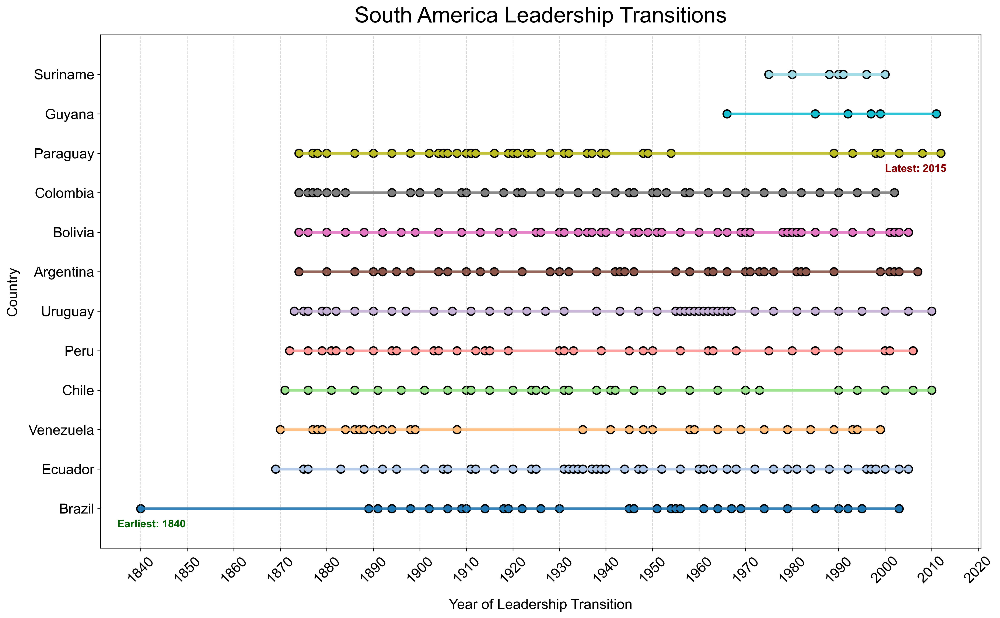

In [20]:
# South America Data Visualization
# 1. Filter South America data
sa_df = df[df['continent'] == 'South America'].copy()

# 2. Sort by earliest start_year in ascending order (the smallest at the bottom)
sa_country_earliest = sa_df.groupby('idacr')['start_year'].min().reset_index()
sa_country_order = sa_country_earliest.sort_values('start_year')['idacr'].tolist()

# 3. Generate country full name mapping
sa_idacr_to_country = sa_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
sa_country_names = [sa_idacr_to_country[idacr] for idacr in sa_country_order]

# 4. Generate exclusive colors
sa_n_countries = len(sa_country_order)
sa_colors = plt.cm.tab20(np.linspace(0, 1, sa_n_countries))

# 5. Calculate extremes (handling missing values)
sa_valid_starts = sa_df['start_year'].dropna()
sa_valid_ends = sa_df['end_year'].dropna()

sa_min_start = sa_valid_starts.min() if not sa_valid_starts.empty else None
sa_max_end = sa_valid_ends.max() if not sa_valid_ends.empty else None

# 6. Plot settings (suitable for fewer countries)
plt.rcParams['font.size'] = 16
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize=(16, 10))  # Moderate height

# 7. Draw lines and points (lines below points)
for i, (idacr, color) in enumerate(zip(sa_country_order, sa_colors)):
    years = sa_df[sa_df['idacr'] == idacr]['start_year'].dropna().unique()
    years_sorted = sorted(years)
    
    # First draw lines (lower layer)
    plt.plot(years_sorted, [i]*len(years_sorted), 
             color=color, linewidth=3, alpha=0.9)
    
    # Then draw points (top layer)
    plt.scatter(years_sorted, [i]*len(years_sorted), 
                color=color, s=80, edgecolors='black', linewidth=1.5)

# 8. Mark earliest start_year (with tolerance)
if sa_min_start is not None:
    # Fuzzy matching to resolve precision issues
    sa_earliest_mask = sa_df['start_year'].between(sa_min_start - 0.1, sa_min_start + 0.1)
    sa_earliest_subset = sa_df[sa_earliest_mask]
    
    if not sa_earliest_subset.empty:
        sa_earliest_idacr = sa_earliest_subset['idacr'].iloc[0]
        sa_earliest_y = sa_country_order.index(sa_earliest_idacr)
        plt.text(
            sa_min_start - 5,  # Left offset
            sa_earliest_y - 0.4,  # Downward offset
            f"Earliest: {int(sa_min_start)}",
            verticalalignment='center', color='darkgreen', 
            fontweight='bold', fontsize=12
        )

# 9. Mark latest end_year (with tolerance)
if sa_max_end is not None:
    sa_latest_mask = sa_df['end_year'].between(sa_max_end - 0.1, sa_max_end + 0.1)
    sa_latest_subset = sa_df[sa_latest_mask]
    
    if not sa_latest_subset.empty:
        sa_latest_idacr = sa_latest_subset['idacr'].iloc[0]
        sa_latest_y = sa_country_order.index(sa_latest_idacr)
        plt.text(
            sa_max_end - 15,  # Right offset
            sa_latest_y - 1.4,  # Downward offset
            f"Latest: {int(sa_max_end)}",
            verticalalignment='center', color='darkred', 
            fontweight='bold', fontsize=12
        )

# 10. Set coordinates
plt.yticks(range(len(sa_country_order)), sa_country_names)  # Y-axis displays full country names
plt.ylim(-1, len(sa_country_order))  # Increase margin

# X-axis every 10 years tick
if not sa_valid_starts.empty:
    sa_min_year = sa_valid_starts.min()
    sa_max_year = sa_valid_starts.max()
    sa_start = int(sa_min_year // 10 * 10)
    sa_end = int((sa_max_year // 10 + 1) * 10)
    sa_xticks = range(sa_start, sa_end + 1, 10)
    plt.xticks(sa_xticks, rotation=45)

# 11. Label settings
plt.xlabel('Year of Leadership Transition', labelpad=15)  # Increase distance from the image
plt.ylabel('Country', labelpad=10)
plt.title('South America Leadership Transitions', fontsize=25, pad=14)  # Separate enlarged title

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

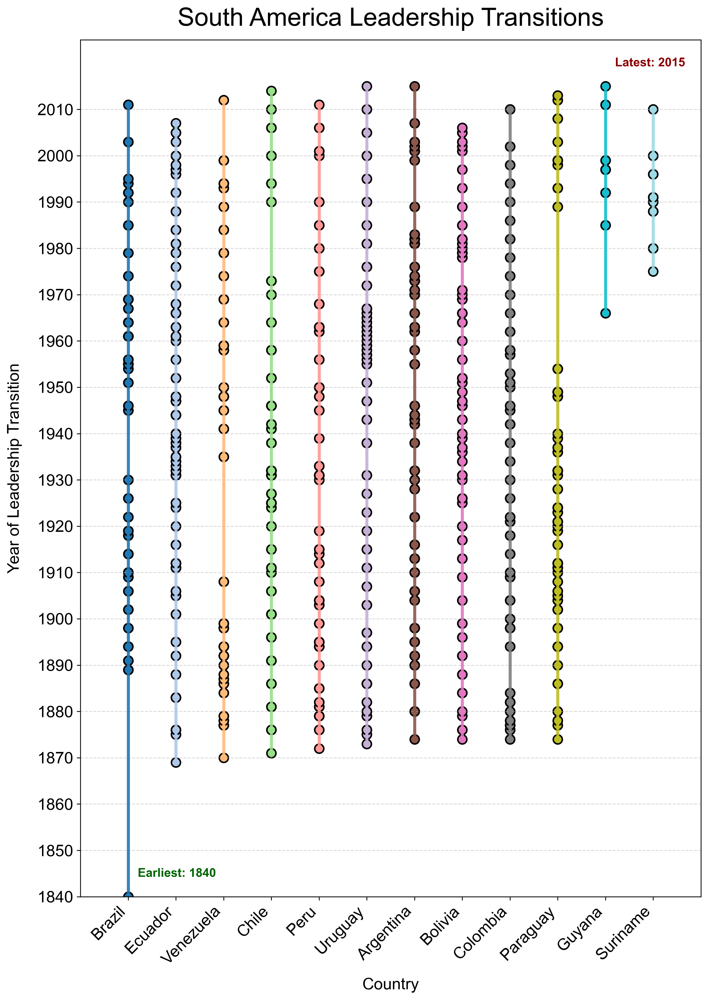

In [21]:
# South American data visualization (horizontal and vertical axes interchanged, including solid lines for periods of government rule and dashed lines for periods of inactivity).
# 1. Seleting South American data
sa_df = df[df['continent'] == 'South America'].copy()

# 2. Sort by earliest start_year in ascending order
sa_country_earliest = sa_df.groupby('idacr')['start_year'].min().reset_index()
sa_country_order = sa_country_earliest.sort_values('start_year')['idacr'].tolist()

# 3. Generate a map of full country names
sa_idacr_to_country = sa_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
sa_country_names = [sa_idacr_to_country[idacr] for idacr in sa_country_order]

# 4. Generate custom colors
sa_n_countries = len(sa_country_order)
sa_colors = plt.cm.tab20(np.linspace(0, 1, sa_n_countries))

# 5. Calculate extreme values (handle null values)
sa_valid_starts = sa_df['start_year'].dropna()
sa_valid_ends = sa_df['end_year'].dropna()

sa_min_start = sa_valid_starts.min() if not sa_valid_starts.empty else None
sa_max_end = sa_valid_ends.max() if not sa_valid_ends.empty else None

# 6. ploting settings
plt.rcParams['font.size'] = 16
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize=(10, 14))  # 宽高适配横纵轴互换

# 7. Draw solid lines for the period of governance and dashed lines for the period of incumbency.
for i, (idacr, color) in enumerate(zip(sa_country_order, sa_colors)):
    # Obtain data on the current country's governance cycle and sort it by time.
    country_data = sa_df[sa_df['idacr'] == idacr].sort_values('start_year')
    start_years = country_data['start_year'].dropna().values
    end_years = country_data['end_year'].dropna().values
    
    if len(start_years) > 0: 
        # Draw a solid line (vertical line segment) for each term of office.
        for s, e in zip(start_years, end_years):
            plt.plot([i, i], [s, e], color=color, linewidth=3, alpha=0.9)
            plt.scatter(i, s, color=color, s=80, edgecolors='black', linewidth=1.5)  # 开始点
            plt.scatter(i, e, color=color, s=80, edgecolors='black', linewidth=1.5)  # 结束点
        
        # Draw a dashed line representing the gap between the end of the previous term and the beginning of the next term.
        if len(end_years) > 1:  # a gap if there are at least two terms in office
            for j in range(1, len(end_years)):
                prev_end = end_years[j-1]  # The year the previous term of office ended
                curr_start = start_years[j]  # The current term of office began
                # If the lines are not continuous (have gaps), draw dashed lines.
                if not np.isclose(prev_end, curr_start):
                    plt.plot([i, i], [prev_end, curr_start], 
                             color=color, linewidth=2, alpha=0.7, linestyle='--')

# 8. Mark the earliest start_year (with fault tolerance)
if sa_min_start is not None:
    sa_earliest_mask = sa_df['start_year'].between(sa_min_start - 0.1, sa_min_start + 0.1)
    sa_earliest_subset = sa_df[sa_earliest_mask]
    
    if not sa_earliest_subset.empty:
        sa_earliest_idacr = sa_earliest_subset['idacr'].iloc[0]
        sa_earliest_x = sa_country_order.index(sa_earliest_idacr)  # x as the national index
        plt.text(
            sa_earliest_x + 0.2,  # to right
            sa_min_start +5,  # to bottom
            f"Earliest: {int(sa_min_start)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkgreen', fontweight='bold', fontsize=12
        )

# 9. Mark the latest end_year (with fault tolerance)
if sa_max_end is not None:
    sa_latest_mask = sa_df['end_year'].between(sa_max_end - 0.1, sa_max_end + 0.1)
    sa_latest_subset = sa_df[sa_latest_mask]
    
    if not sa_latest_subset.empty:
        sa_latest_idacr = sa_latest_subset['idacr'].iloc[0]
        sa_latest_x = sa_country_order.index(sa_latest_idacr)  
        plt.text(
            sa_latest_x + 0.2, 
            sa_max_end + 5,  
            f"Latest: {int(sa_max_end)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkred', fontweight='bold', fontsize=12
        )

# 10. Set the coordinate axes (force the vertical axis to start from 1840).
if not sa_valid_starts.empty:
    sa_min_year = min(sa_valid_starts.min(), 1840)  
    sa_max_year = sa_valid_ends.max() if not sa_valid_ends.empty else sa_valid_starts.max()
    y_min = 1840
    y_max = sa_max_year + 10  
    sa_yticks = range(y_min, int((sa_max_year // 10 + 1) * 10), 10)  
    plt.yticks(sa_yticks)
    plt.ylim(y_min, y_max)
else:
    # If no data is available, the system will still force the display to show 1840 as the starting point.
    plt.ylim(1840, 1860)
    plt.yticks(range(1840, 1870, 10))

# x-axis as nation
plt.xticks(range(len(sa_country_order)), sa_country_names, rotation=45, ha='right')
plt.xlim(-1, len(sa_country_order))  # increase horizontal axis margin

# 11. label setting
plt.ylabel('Year of Leadership Transition', labelpad=15)
plt.xlabel('Country', labelpad=10)
plt.title('South America Leadership Transitions', fontsize=25, pad=14)

plt.grid(axis='y', linestyle='--', alpha=0.5)  # Grid lines are displayed along the Y-axis (time axis).
plt.tight_layout()
plt.show()

### 4-3. Plot leadership transition of Asia ###

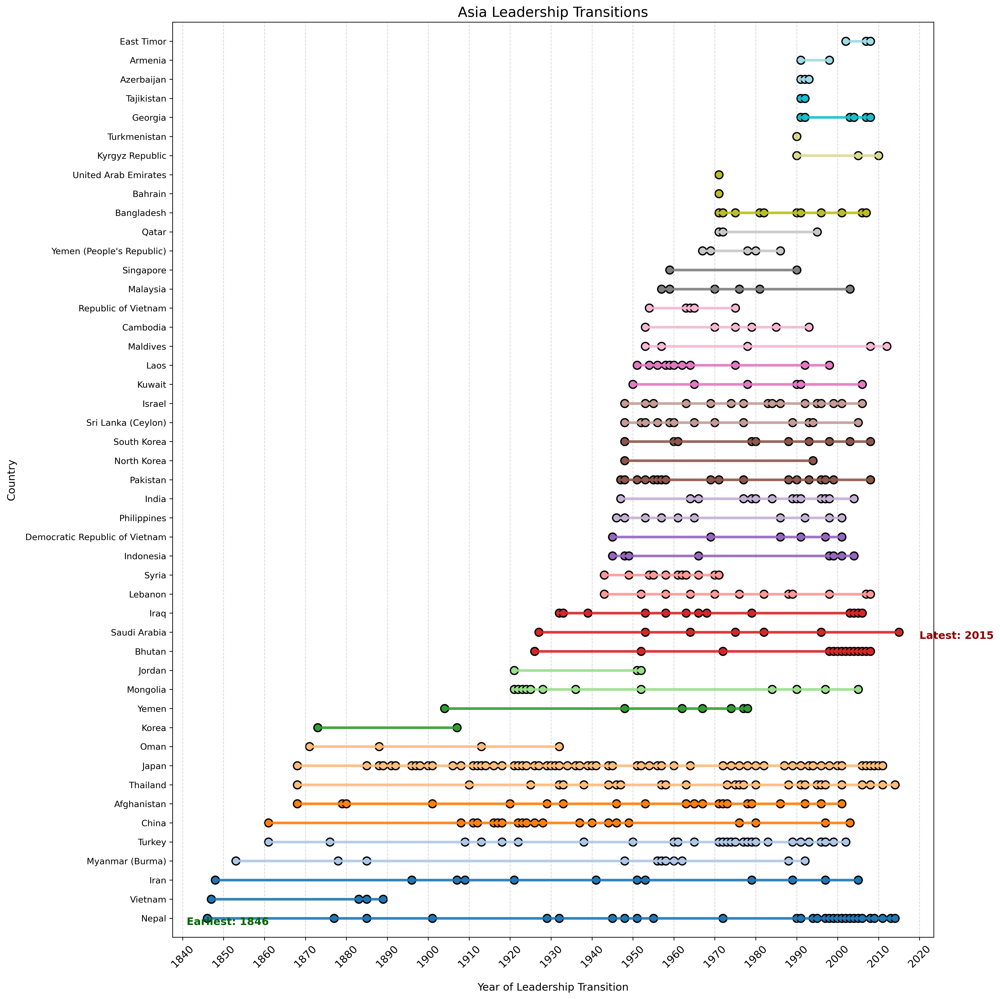

In [23]:
# Asia Data Visualization (Adjusted According to North American Logic)

# 1. Filter Asian data
asia_df = df[df['continent'] == 'Asia'].copy()

# 2. Sort by earliest start_year in ascending order (the smallest at the bottom)
asia_country_earliest = asia_df.groupby('idacr')['start_year'].min().reset_index()
asia_country_order = asia_country_earliest.sort_values('start_year')['idacr'].tolist()

# 3. Generate country full name mapping
asia_idacr_to_country = asia_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
asia_country_names = [asia_idacr_to_country[idacr] for idacr in asia_country_order]

# 4. Generate exclusive colors
asia_n_countries = len(asia_country_order)
asia_colors = plt.cm.tab20(np.linspace(0, 1, asia_n_countries))  # Suitable for a moderate number of countries

# 5. Calculate extremes (handling missing values)
asia_valid_starts = asia_df['start_year'].dropna()
asia_valid_ends = asia_df['end_year'].dropna()

asia_min_start = asia_valid_starts.min() if not asia_valid_starts.empty else None
asia_max_end = asia_valid_ends.max() if not asia_valid_ends.empty else None

# 6. Plot settings (using 16x16 size)
plt.rcParams['font.size'] = 12
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize=(16, 16))  # Width and height both 16, balancing the number of Asian countries

# 7. Draw lines and points (lines below points, consistent with North American logic)
for i, (idacr, color) in enumerate(zip(asia_country_order, asia_colors)):
    years = asia_df[asia_df['idacr'] == idacr]['start_year'].dropna().unique()
    years_sorted = sorted(years)
    
    # First draw lines (lower layer)
    plt.plot(years_sorted, [i]*len(years_sorted), 
             color=color, linewidth=3, alpha=0.9)
    
    # Then draw points (top layer)
    plt.scatter(years_sorted, [i]*len(years_sorted), 
                color=color, s=80, edgecolors='black', linewidth=1.5)

# 8. Mark earliest start_year (with tolerance)
if asia_min_start is not None:
    asia_earliest_mask = asia_df['start_year'].between(asia_min_start - 0.1, asia_min_start + 0.1)
    asia_earliest_subset = asia_df[asia_earliest_mask]
    
    if not asia_earliest_subset.empty:
        asia_earliest_idacr = asia_earliest_subset['idacr'].iloc[0]
        # Ensure the country is in the sorted list
        if asia_earliest_idacr in asia_country_order:
            asia_earliest_y = asia_country_order.index(asia_earliest_idacr)
            plt.text(
                asia_min_start - 5,
                asia_earliest_y - 0.2,
                f"Earliest: {int(asia_min_start)}",
                verticalalignment='center', color='darkgreen',
                fontweight='bold', fontsize=12
            )

# 9. Mark latest end_year (with tolerance)
if asia_max_end is not None:
    asia_latest_mask = asia_df['end_year'].between(asia_max_end - 0.1, asia_max_end + 0.1)
    asia_latest_subset = asia_df[asia_latest_mask]
    
    if not asia_latest_subset.empty:
        asia_latest_idacr = asia_latest_subset['idacr'].iloc[0]
        if asia_latest_idacr in asia_country_order:
            asia_latest_y = asia_country_order.index(asia_latest_idacr)
            plt.text(
                asia_max_end + 5,
                asia_latest_y - 0.2,
                f"Latest: {int(asia_max_end)}",
                verticalalignment='center', color='darkred',
                fontweight='bold', fontsize=12
            )

# 10. Set coordinates
plt.yticks(range(len(asia_country_order)), asia_country_names, fontsize=10)  # Moderate font size
plt.ylim(-1, len(asia_country_order))  # Increase margin

# X-axis every 10 years tick
if not asia_valid_starts.empty:
    asia_min_year = asia_valid_starts.min()
    asia_max_year = asia_valid_starts.max()
    asia_start = int(asia_min_year // 10 * 10)
    asia_end = int((asia_max_year // 10 + 1) * 10)
    asia_xticks = range(asia_start, asia_end + 1, 10)
    plt.xticks(asia_xticks, rotation=45)

# 11. Label settings (consistent with North America)
plt.xlabel('Year of Leadership Transition', labelpad=15)
plt.ylabel('Country', labelpad=10)
plt.title('Asia Leadership Transitions', fontsize=16)

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

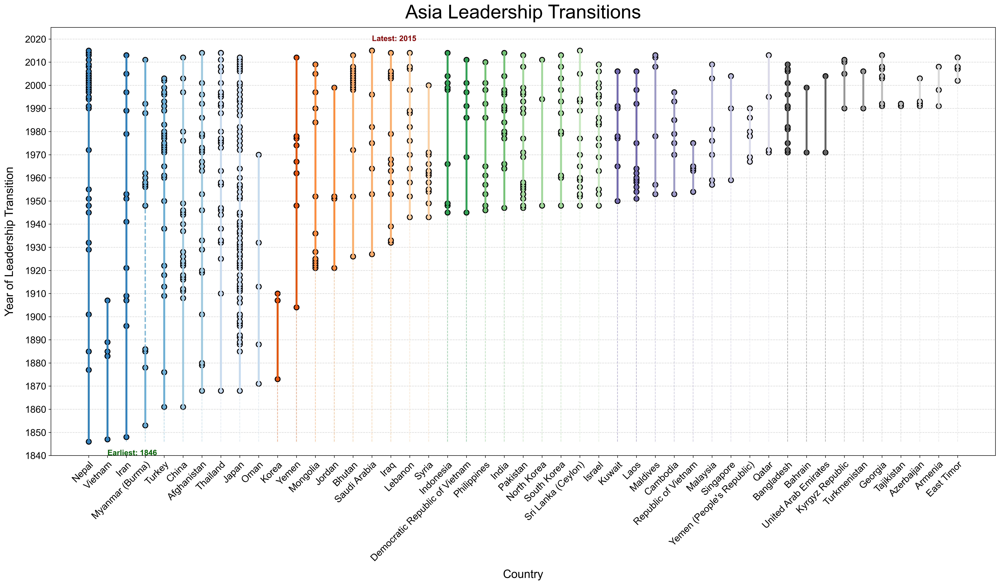

In [35]:
def plot_asia_leadership_transitions(df):
    # 1. Filter Asia data
    asia_df = df[df['continent'] == 'Asia'].copy()
    
    # 2. Sort countries by earliest start_year in ascending order
    asia_country_earliest = asia_df.groupby('idacr')['start_year'].min().reset_index()
    asia_country_order = asia_country_earliest.sort_values('start_year')['idacr'].tolist()
    
    # 3. Generate country full name mapping
    asia_idacr_to_country = asia_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
    asia_country_names = [asia_idacr_to_country[idacr] for idacr in asia_country_order]
    
    # 4. Generate exclusive colors (adapted for multiple Asian countries)
    asia_n_countries = len(asia_country_order)
    asia_colors = plt.cm.tab20c(np.linspace(0, 1, asia_n_countries))  # Rich color set to avoid confusion
    
    # 5. Calculate extremes (handling missing values)
    asia_valid_starts = asia_df['start_year'].dropna()
    asia_valid_ends = asia_df['end_year'].dropna()
    
    asia_min_start = asia_valid_starts.min() if not asia_valid_starts.empty else None
    asia_max_end = asia_valid_ends.max() if not asia_valid_ends.empty else None
    
    # 6. Plot settings (use ax object to ensure consistency)
    plt.rcParams['font.size'] = 17
    plt.rcParams['figure.dpi'] = 300
    fig, ax = plt.subplots(figsize=(22, 13))  # Explicitly create fig and ax objects
    
    # 7. Draw connecting lines, solid lines for terms of office (increased), dashed lines for gaps (increased), and markers
    for i, (idacr, color) in enumerate(zip(asia_country_order, asia_colors)):
        # Get the current country's term of office and sort
        country_data = asia_df[asia_df['idacr'] == idacr].sort_values('start_year')
        start_years = country_data['start_year'].dropna().values
        end_years = country_data['end_year'].dropna().values
        
        if len(start_years) > 0:  # Only process countries with data
            # Bottom connecting line: from the minimum value on the vertical axis to the country's earliest start year (retain original thin dashed line)
            min_year = min(start_years)
            y_min = asia_valid_starts.min() if not asia_valid_starts.empty else 1840
            ax.plot(
                [i, i], [y_min, min_year],
                color=color, linewidth=1, alpha=0.5, linestyle='--'  # Maintain original auxiliary line style
            )
            
            # Draw solid lines for each term of office (increased: line width of 3 + fully opaque)
            for s, e in zip(start_years, end_years):
                ax.plot([i, i], [s, e], color=color, linewidth=3, alpha=1.0)
                # Mark points (thicker edges for better recognition)
                ax.scatter(i, s, color=color, s=60, edgecolors='black', linewidth=1.5)  # Start point
                ax.scatter(i, e, color=color, s=60, edgecolors='black', linewidth=1.5)  # End point
            
            # Draw dashed lines for gaps (increased: line width of 2 + high opacity)
            if len(end_years) > 1:  # At least two terms of office to have a gap
                for j in range(1, len(end_years)):
                    prev_end = end_years[j-1]
                    curr_start = start_years[j]
                    if not np.isclose(prev_end, curr_start):  # There is a gap
                        ax.plot([i, i], [prev_end, curr_start], 
                                color=color, linewidth=2, alpha=0.9, linestyle='--')

    # 8. Mark the earliest start_year directly from the data
    if asia_min_start is not None:
        asia_earliest_row = asia_df[asia_df['start_year'] == asia_min_start].iloc[0]
        asia_earliest_x = asia_country_order.index(asia_earliest_row['idacr'])
        ax.text(
            asia_earliest_x + 1,
            asia_min_start - 5,
            f"Earliest: {int(asia_min_start)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkgreen', fontweight='bold', fontsize=12
        )
    
    # 9. Mark the latest end_year directly from the data
    if asia_max_end is not None:
        asia_latest_row = asia_df[asia_df['end_year'] == asia_max_end].iloc[0]
        asia_latest_x = asia_country_order.index(asia_latest_row['idacr'])
        ax.text(
            asia_latest_x,
            asia_max_end + 5,
            f"Latest: {int(asia_max_end)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkred', fontweight='bold', fontsize=12
        )
    
    # 10. Set coordinates (use ax object to ensure rotation works)
    # X-axis country names (force rotation)
    ax.set_xticks(range(len(asia_country_order)))
    ax.set_xticklabels(
        asia_country_names,
        rotation=45,  # Rotation angle
        ha='right',
        fontsize=15,
        rotation_mode='anchor'  # Ensure the anchor point of rotation is correct
    )
    ax.set_xlim(-2, len(asia_country_order) + 1)  # Horizontal axis margin
    
    # Vertical axis time (force to start from 1850)
    if not asia_valid_starts.empty:
        asia_max_year = max(asia_valid_starts.max(), asia_valid_ends.max()) if not asia_valid_ends.empty else asia_valid_starts.max()
        y_min = 1840
        y_max = max(asia_max_year + 10, 1850)
        asia_yticks = range(y_min, int((y_max // 10 + 1) * 10), 10)
        ax.set_yticks(asia_yticks)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_ylim(y_min, y_max)
    else:
        ax.set_ylim(1840, 1860)
        ax.set_yticks(range(1840, 1870, 10))
        ax.tick_params(axis='y', labelsize=15)
    
    # 11. Label settings
    ax.set_ylabel('Year of Leadership Transition', labelpad=15, fontsize=18)
    ax.set_xlabel('Country', labelpad=10, fontsize=18)
    ax.set_title('Asia Leadership Transitions', fontsize=30, pad=14)
    
    ax.grid(axis='y', linestyle='--', alpha=0.5)  # Maintain original transparency of grid lines, not to interfere
    plt.tight_layout()
    plt.show()

# Call the function for Asia
plot_asia_leadership_transitions(df)

### 4-4. Plot leadership transition in Europe ###

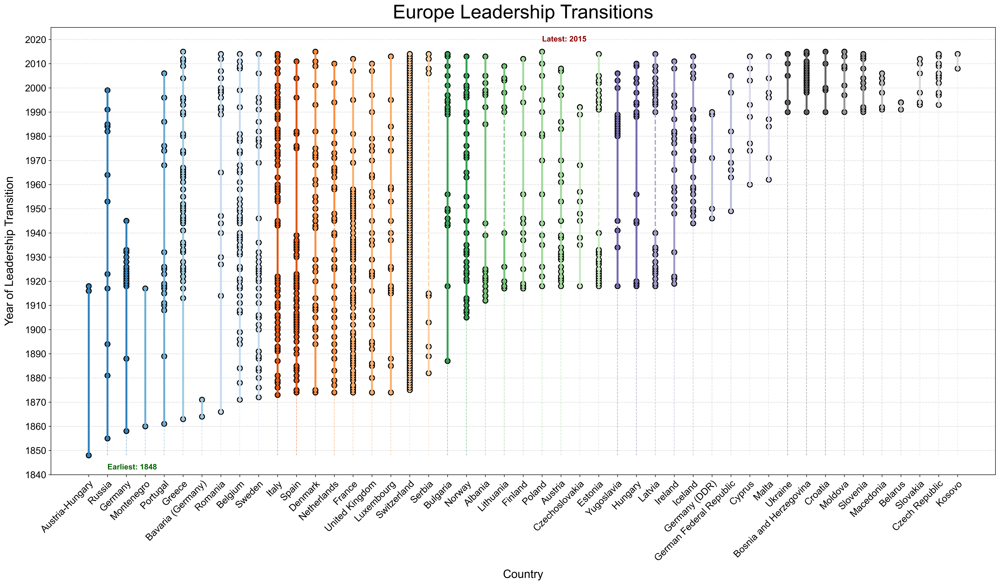

In [33]:
def plot_europe_leadership_transitions(df):
    # 1. Filter Europe data
    europe_df = df[df['continent'] == 'Europe'].copy()
    
    # 2. Sort countries by earliest start_year in ascending order
    europe_country_earliest = europe_df.groupby('idacr')['start_year'].min().reset_index()
    europe_country_order = europe_country_earliest.sort_values('start_year')['idacr'].tolist()
    
    # 3. Generate country full name mapping
    europe_idacr_to_country = europe_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
    europe_country_names = [europe_idacr_to_country[idacr] for idacr in europe_country_order]
    
    # 4. Generate exclusive colors (adapted for multiple European countries)
    europe_n_countries = len(europe_country_order)
    europe_colors = plt.cm.tab20c(np.linspace(0, 1, europe_n_countries))  # Rich color set to avoid confusion
    
    # 5. Calculate extremes (handling missing values)
    europe_valid_starts = europe_df['start_year'].dropna()
    europe_valid_ends = europe_df['end_year'].dropna()
    
    europe_min_start = europe_valid_starts.min() if not europe_valid_starts.empty else None
    europe_max_end = europe_valid_ends.max() if not europe_valid_ends.empty else None
    
    # 6. Plot settings (use ax object to ensure consistency)
    plt.rcParams['font.size'] = 17
    plt.rcParams['figure.dpi'] = 300
    fig, ax = plt.subplots(figsize=(22, 13))  # Explicitly create fig and ax objects
    
    # 7. Draw connecting lines, solid lines for terms of office (increased), dashed lines for gaps (increased), and markers
    for i, (idacr, color) in enumerate(zip(europe_country_order, europe_colors)):
        # Get the current country's term of office and sort
        country_data = europe_df[europe_df['idacr'] == idacr].sort_values('start_year')
        start_years = country_data['start_year'].dropna().values
        end_years = country_data['end_year'].dropna().values
        
        if len(start_years) > 0:  # Only process countries with data
            # Bottom connecting line: from the minimum value on the vertical axis to the country's earliest start year (retain original thin dashed line)
            min_year = min(start_years)
            y_min = europe_valid_starts.min() if not europe_valid_starts.empty else 1840
            ax.plot(
                [i, i], [y_min, min_year],
                color=color, linewidth=1, alpha=0.5, linestyle='--'  # Maintain original auxiliary line style
            )
            
            # Draw solid lines for each term of office (increased: line width of 3 + fully opaque)
            for s, e in zip(start_years, end_years):
                ax.plot([i, i], [s, e], color=color, linewidth=3, alpha=1.0)
                # Mark points (thicker edges for better recognition)
                ax.scatter(i, s, color=color, s=60, edgecolors='black', linewidth=1.5)  # Start point
                ax.scatter(i, e, color=color, s=60, edgecolors='black', linewidth=1.5)  # End point
            
            # Draw dashed lines for gaps (increased: line width of 2 + high opacity)
            if len(end_years) > 1:  # At least two terms of office to have a gap
                for j in range(1, len(end_years)):
                    prev_end = end_years[j-1]
                    curr_start = start_years[j]
                    if not np.isclose(prev_end, curr_start):  # There is a gap
                        ax.plot([i, i], [prev_end, curr_start], 
                                color=color, linewidth=2, alpha=0.9, linestyle='--')

    # 8. Mark the earliest start_year directly from the data
    if europe_min_start is not None:
        europe_earliest_row = europe_df[europe_df['start_year'] == europe_min_start].iloc[0]
        europe_earliest_x = europe_country_order.index(europe_earliest_row['idacr'])
        ax.text(
            europe_earliest_x + 1,
            europe_min_start - 5,
            f"Earliest: {int(europe_min_start)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkgreen', fontweight='bold', fontsize=12
        )
    
    # 9. Mark the latest end_year directly from the data
    if europe_max_end is not None:
        europe_latest_row = europe_df[europe_df['end_year'] == europe_max_end].iloc[0]
        europe_latest_x = europe_country_order.index(europe_latest_row['idacr'])
        ax.text(
            europe_latest_x,
            europe_max_end + 5,
            f"Latest: {int(europe_max_end)}",
            horizontalalignment='left', verticalalignment='center',
            color='darkred', fontweight='bold', fontsize=12
        )
    
    # 10. Set coordinates (use ax object to ensure rotation works)
    # X-axis country names (force rotation)
    ax.set_xticks(range(len(europe_country_order)))
    ax.set_xticklabels(
        europe_country_names,
        rotation=45,  # Rotation angle
        ha='right',
        fontsize=15,
        rotation_mode='anchor'  # Ensure the anchor point of rotation is correct
    )
    ax.set_xlim(-2, len(europe_country_order) + 1)  # Horizontal axis margin
    
    # Vertical axis time (force to start from 1850)
    if not europe_valid_starts.empty:
        europe_max_year = max(europe_valid_starts.max(), europe_valid_ends.max()) if not europe_valid_ends.empty else europe_valid_starts.max()
        y_min = 1840
        y_max = max(europe_max_year + 10, 1850)
        europe_yticks = range(y_min, int((y_max // 10 + 1) * 10), 10)
        ax.set_yticks(europe_yticks)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_ylim(y_min, y_max)
    else:
        ax.set_ylim(1840, 1860)
        ax.set_yticks(range(1840, 1870, 10))
        ax.tick_params(axis='y', labelsize=15)
    
    # 11. Label settings
    ax.set_ylabel('Year of Leadership Transition', labelpad=15, fontsize=18)
    ax.set_xlabel('Country', labelpad=10, fontsize=18)
    ax.set_title('Europe Leadership Transitions', fontsize=30, pad=14)
    
    ax.grid(axis='y', linestyle='--', alpha=0.5)  # Maintain original transparency of grid lines, not to interfere
    plt.tight_layout()
    plt.show()

# Call the function for Europe
plot_europe_leadership_transitions(df)

### 4-5. Plot leadership transition of Africa ##

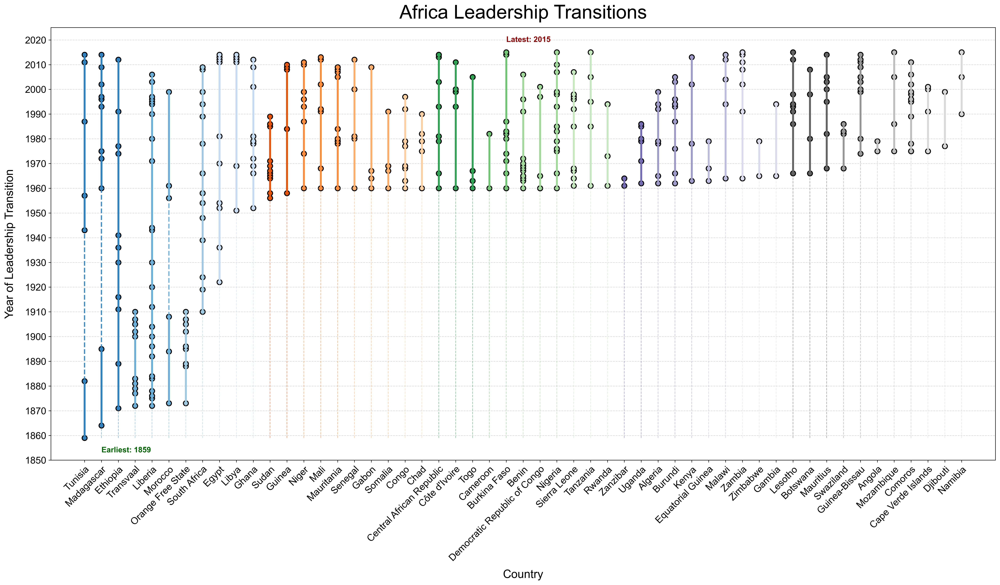

In [23]:
# Africa Data Visualization (Countries on the horizontal axis, time on the vertical axis, includes terms of office and gaps, increased line thickness)
def plot_africa_leadership_transitions(df):
    # 1. Filter Africa data
    africa_df = df[df['continent'] == 'Africa'].copy()
    
    # 2. Sort countries by earliest start_year in ascending order
    africa_country_earliest = africa_df.groupby('idacr')['start_year'].min().reset_index()
    africa_country_order = africa_country_earliest.sort_values('start_year')['idacr'].tolist()
    
    # 3. Generate country full name mapping
    africa_idacr_to_country = africa_df.drop_duplicates('idacr').set_index('idacr')['country'].to_dict()
    africa_country_names = [africa_idacr_to_country[idacr] for idacr in africa_country_order]
    
    # 4. Generate exclusive colors (adapted for multiple African countries)
    africa_n_countries = len(africa_country_order)
    africa_colors = plt.cm.tab20c(np.linspace(0, 1, africa_n_countries))  # Rich color set to avoid confusion
    
    # 5. Calculate extremes (handling missing values)
    africa_valid_starts = africa_df['start_year'].dropna()
    africa_valid_ends = africa_df['end_year'].dropna()
    
    africa_min_start = africa_valid_starts.min() if not africa_valid_starts.empty else None
    africa_max_end = africa_valid_ends.max() if not africa_valid_ends.empty else None
    
    # 6. Plot settings (use ax object to ensure consistency)
    plt.rcParams['font.size'] = 17
    plt.rcParams['figure.dpi'] = 300
    fig, ax = plt.subplots(figsize=(22, 13))  # Explicitly create fig and ax objects
    
    # 7. Draw connecting lines, solid lines for terms of office (increased), dashed lines for gaps (increased), and markers
    for i, (idacr, color) in enumerate(zip(africa_country_order, africa_colors)):
        # Get the current country's term of office and sort
        country_data = africa_df[africa_df['idacr'] == idacr].sort_values('start_year')
        start_years = country_data['start_year'].dropna().values
        end_years = country_data['end_year'].dropna().values
        
        if len(start_years) > 0:  # Only process countries with data
            # Bottom connecting line: from the minimum value on the vertical axis to the country's earliest start year (retain original thin dashed line)
            min_year = min(start_years)
            y_min = africa_valid_starts.min() if not africa_valid_starts.empty else 1840
            ax.plot(
                [i, i], [y_min, min_year],
                color=color, linewidth=1, alpha=0.5, linestyle='--'  # Maintain original auxiliary line style
            )
            
            # Draw solid lines for each term of office (increased: line width of 3 + fully opaque)
            for s, e in zip(start_years, end_years):
                ax.plot([i, i], [s, e], color=color, linewidth=3, alpha=1.0)
                # Mark points (thicker edges for better recognition)
                ax.scatter(i, s, color=color, s=60, edgecolors='black', linewidth=1.5)  # Start point
                ax.scatter(i, e, color=color, s=60, edgecolors='black', linewidth=1.5)  # End point
            
            # Draw dashed lines for gaps (increased: line width of 2 + high opacity)
            if len(end_years) > 1:  # At least two terms of office to have a gap
                for j in range(1, len(end_years)):
                    prev_end = end_years[j-1]
                    curr_start = start_years[j]
                    if not np.isclose(prev_end, curr_start):  # There is a gap
                        ax.plot([i, i], [prev_end, curr_start], 
                                color=color, linewidth=2, alpha=0.9, linestyle='--')
    
    # 8. Mark the earliest start_year (correct mask logic to ensure precise matching)
    if africa_min_start is not None:
        africa_earliest_mask = africa_df['start_year'].between(africa_min_start - 0.1, africa_min_start + 0.1)
        africa_earliest_subset = africa_df[africa_earliest_mask]
        
        if not africa_earliest_subset.empty:
            africa_earliest_idacr = africa_earliest_subset['idacr'].iloc[0]
            if africa_earliest_idacr in africa_country_order:
                africa_earliest_x = africa_country_order.index(africa_earliest_idacr)
                ax.text(
                    africa_earliest_x + 1,
                    africa_min_start - 5,
                    f"Earliest: {int(africa_min_start)}",
                    horizontalalignment='left', verticalalignment='center',
                    color='darkgreen', fontweight='bold', fontsize=12
                )
    
    # 9. Mark the latest end_year
    if africa_max_end is not None:
        africa_latest_mask = africa_df['end_year'].between(africa_max_end - 0.1, africa_max_end + 0.1)
        africa_latest_subset = africa_df[africa_latest_mask]
        
        if not africa_latest_subset.empty:
            africa_latest_idacr = africa_latest_subset['idacr'].iloc[0]
            if africa_latest_idacr in africa_country_order:
                africa_latest_x = africa_country_order.index(africa_latest_idacr)
                ax.text(
                    africa_latest_x,
                    africa_max_end + 5,
                    f"Latest: {int(africa_max_end)}",
                    horizontalalignment='left', verticalalignment='center',
                    color='darkred', fontweight='bold', fontsize=12
                )
    
    # 10. Set coordinates (use ax object to ensure rotation works)
    # X-axis country names (force rotation)
    ax.set_xticks(range(len(africa_country_order)))
    ax.set_xticklabels(
        africa_country_names,
        rotation=45,  # Rotation angle
        ha='right',
        fontsize=15,
        rotation_mode='anchor'  # Ensure the anchor point of rotation is correct
    )
    ax.set_xlim(-2, len(africa_country_order) + 1)  # Horizontal axis margin
    
    # Vertical axis time (force to start from 1850)
    if not africa_valid_starts.empty:
        africa_max_year = max(africa_valid_starts.max(), africa_valid_ends.max()) if not africa_valid_ends.empty else africa_valid_starts.max()
        y_min = 1850
        y_max = max(africa_max_year + 10, 1850)
        africa_yticks = range(y_min, int((y_max // 10 + 1) * 10), 10)
        ax.set_yticks(africa_yticks)
        ax.tick_params(axis='y', labelsize=15)
        ax.set_ylim(y_min, y_max)
    else:
        ax.set_ylim(1840, 1860)
        ax.set_yticks(range(1840, 1870, 10))
        ax.tick_params(axis='y', labelsize=15)
    
    # 11. Label settings
    ax.set_ylabel('Year of Leadership Transition', labelpad=15, fontsize=18)
    ax.set_xlabel('Country', labelpad=10, fontsize=18)
    ax.set_title('Africa Leadership Transitions', fontsize=30, pad=14)
    
    ax.grid(axis='y', linestyle='--', alpha=0.5)  # Maintain original transparency of grid lines, not to interfere
    plt.tight_layout()
    plt.show()

# Call the function when using
plot_africa_leadership_transitions(df)